# "Traffic, Driving Style and Road Surface Condition" Dataset EDA

### Content
- [Data Preparation](#Data-Preparation)
- [Data Analysis](#Data-Analysis)
- [Conclusion](#Conclusion)

## Data Preparation

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [34]:
opelDf = pd.read_csv("DS1.csv",sep=";")
opelDf2 = pd.read_csv("DS2.csv",sep=";")
peugeotDf = pd.read_csv("DS3.csv",sep=";")
peugeotDf2 = pd.read_csv("DS4.csv",sep=";")
all_cars_df = pd.concat([opelDf, opelDf2, peugeotDf, peugeotDf2], axis=0)
all_cars_df = all_cars_df.replace(',','.', regex=True)

In [35]:
all_cars_df.shape

(24957, 17)

In [36]:
all_cars_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24957 entries, 0 to 4622
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   AltitudeVariation          24777 non-null  object 
 1   VehicleSpeedInstantaneous  24913 non-null  object 
 2   VehicleSpeedAverage        23775 non-null  object 
 3   VehicleSpeedVariance       23775 non-null  object 
 4   VehicleSpeedVariation      24769 non-null  object 
 5   LongitudinalAcceleration   24957 non-null  object 
 6   EngineLoad                 24952 non-null  object 
 7   EngineCoolantTemperature   24952 non-null  float64
 8   ManifoldAbsolutePressure   24952 non-null  float64
 9   EngineRPM                  24952 non-null  object 
 10  MassAirFlow                24952 non-null  object 
 11  IntakeAirTemperature       24952 non-null  float64
 12  VerticalAcceleration       24957 non-null  object 
 13  FuelConsumptionAverage     24671 non-null  obje

There are issues in the data types of all attributes but `roadSurface`, `traffic` and `drivingStyle` (Target)

In [37]:
all_cars_df = all_cars_df.astype({'AltitudeVariation':np.float64, 
                        'VehicleSpeedInstantaneous':np.float64,
                        'VehicleSpeedAverage':np.float64,
                        'VehicleSpeedVariance':np.float64,
                        'VehicleSpeedVariation':np.float64,
                        'LongitudinalAcceleration':np.float64,
                        'EngineLoad':np.float64,
                        'EngineRPM':np.float64,
                        'MassAirFlow':np.float64,
                        'VerticalAcceleration':np.float64,
                        'FuelConsumptionAverage':np.float64,
                       })

In [38]:
all_cars_df.describe()

,AltitudeVariation,VehicleSpeedInstantaneous,VehicleSpeedAverage,VehicleSpeedVariance,VehicleSpeedVariation,LongitudinalAcceleration,EngineLoad,EngineCoolantTemperature,ManifoldAbsolutePressure,EngineRPM,MassAirFlow,IntakeAirTemperature,VerticalAcceleration,FuelConsumptionAverage
count,24777.000000,24913.000000,23775.000000,23775.000000,24769.000000,24957.000000,24952.000000,24952.000000,24952.000000,24952.000000,24952.000000,24952.000000,24957.000000,24671.000000
mean,-0.358978,37.478053,38.811064,171.920888,-0.000182,0.664613,36.929462,69.209402,114.620151,1472.319073,15.849782,23.228358,0.472429,16.344781
std,2.828649,33.606792,31.149198,182.751192,2.469111,1.579335,26.444516,17.554560,20.167027,574.951436,9.557082,10.834720,3.454884,10.443738
min,-59.300003,0.000000,0.000000,0.000000,-103.500000,-3.065000,0.000000,8.000000,88.000000,0.000000,0.880000,7.000000,-2.763100,7.271883
25%,-1.400024,10.133100,15.991532,46.048954,-0.900000,-0.225400,19.215687,61.000000,102.000000,850.000000,7.160000,16.000000,-0.536100,11.773159
50%,-0.099998,30.174118,29.314682,113.907731,0.000000,0.358500,31.764706,79.000000,106.000000,1464.500000,15.090000,19.000000,-0.066400,14.687192
75%,0.700005,53.142479,50.148162,230.200656,0.900002,1.129000,58.039215,80.000000,119.000000,1930.000000,21.350000,30.000000,0.234400,18.843950
max,56.099998,124.749725,121.330733,1418.370369,97.199997,8.477800,100.000000,89.000000,252.000000,3167.000000,73.250000,65.000000,17.944800,202.539123


### Data Wrangling

In [39]:
all_cars_df["AltitudeVariation"].fillna(all_cars_df["AltitudeVariation"].median(), inplace= True)
all_cars_df["VehicleSpeedInstantaneous"].fillna(all_cars_df["VehicleSpeedInstantaneous"].median(), inplace= True)
all_cars_df["VehicleSpeedAverage"].fillna(all_cars_df["VehicleSpeedAverage"].mean(), inplace= True)
all_cars_df["VehicleSpeedVariance"].fillna(all_cars_df["VehicleSpeedVariance"].median(), inplace= True)
all_cars_df["VehicleSpeedVariation"].fillna(all_cars_df["VehicleSpeedVariation"].median(), inplace= True)
all_cars_df["FuelConsumptionAverage"].fillna(all_cars_df["FuelConsumptionAverage"].mean(), inplace= True)

#Next attributes have only 5 NaNs so they are easy to replace with the average
all_cars_df["EngineLoad"].fillna(all_cars_df["EngineLoad"].mean(), inplace= True)
all_cars_df["EngineCoolantTemperature"].fillna(all_cars_df["EngineCoolantTemperature"].mean(), inplace= True)
all_cars_df["ManifoldAbsolutePressure"].fillna(all_cars_df["ManifoldAbsolutePressure"].mean(), inplace= True)
all_cars_df["EngineRPM"].fillna(all_cars_df["EngineRPM"].mean(), inplace= True)
all_cars_df["MassAirFlow"].fillna(all_cars_df["MassAirFlow"].mean(), inplace= True)
all_cars_df["IntakeAirTemperature"].fillna(all_cars_df["IntakeAirTemperature"].mean(), inplace= True)
all_cars_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24957 entries, 0 to 4622
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   AltitudeVariation          24957 non-null  float64
 1   VehicleSpeedInstantaneous  24957 non-null  float64
 2   VehicleSpeedAverage        24957 non-null  float64
 3   VehicleSpeedVariance       24957 non-null  float64
 4   VehicleSpeedVariation      24957 non-null  float64
 5   LongitudinalAcceleration   24957 non-null  float64
 6   EngineLoad                 24957 non-null  float64
 7   EngineCoolantTemperature   24957 non-null  float64
 8   ManifoldAbsolutePressure   24957 non-null  float64
 9   EngineRPM                  24957 non-null  float64
 10  MassAirFlow                24957 non-null  float64
 11  IntakeAirTemperature       24957 non-null  float64
 12  VerticalAcceleration       24957 non-null  float64
 13  FuelConsumptionAverage     24957 non-null  floa

In [48]:
all_cars_df = all_cars_df.reset_index()

## Data Analysis

In [49]:
all_cars_df[["traffic","roadSurface","drivingStyle"]].nunique()

traffic         3
roadSurface     3
drivingStyle    2
dtype: int64

In [50]:
all_cars_df["traffic"].value_counts()

LowCongestionCondition       18769
NormalCongestionCondition     3171
HighCongestionCondition       3017
Name: traffic, dtype: int64

In [51]:
all_cars_df["drivingStyle"].value_counts()

EvenPaceStyle      22089
AggressiveStyle     2868
Name: drivingStyle, dtype: int64

In [52]:
all_cars_df["roadSurface"].value_counts()

SmoothCondition         15242
UnevenCondition          6466
FullOfHolesCondition     3249
Name: roadSurface, dtype: int64

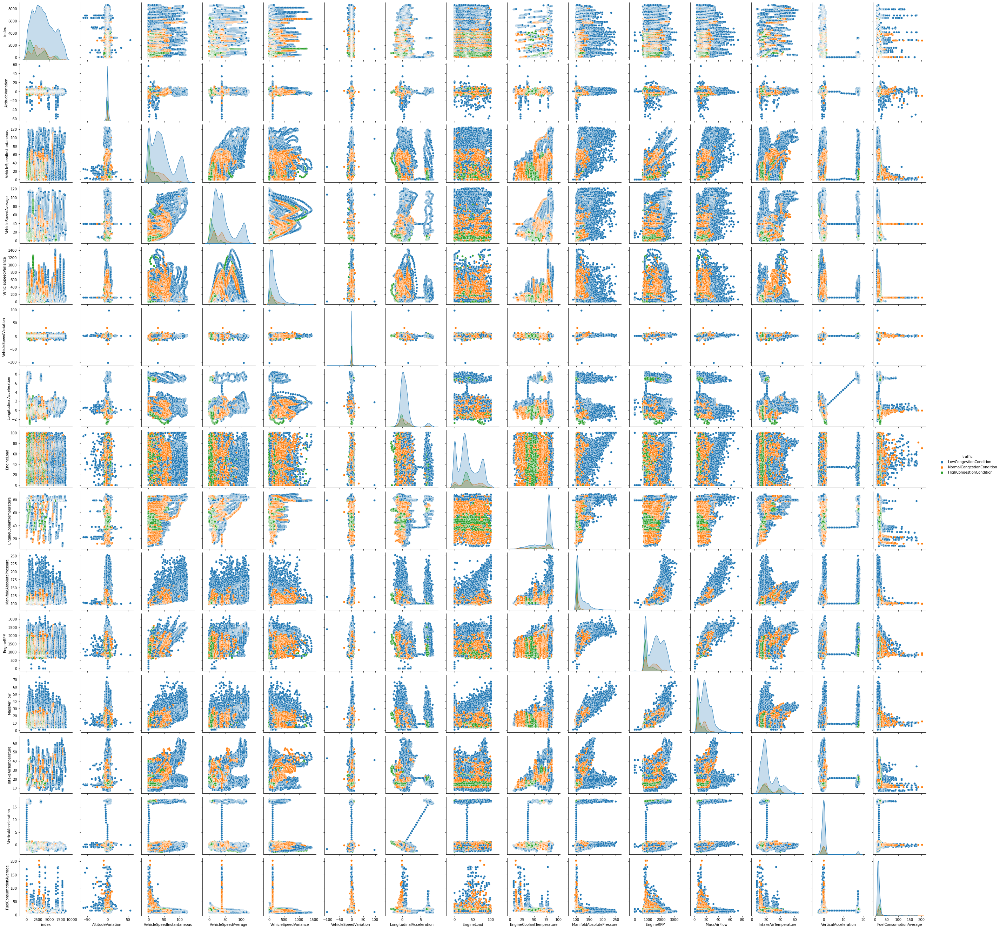

In [53]:
sns.pairplot(all_cars_df, hue="traffic")

Here, we see that `VehicleSpeedAverage` along with `EngineLoad` may give a great information gain on the status of traffic. In addition, `IntakeAirTemperature` may be an indicator of traffic, however this needs to be studied whether it is affected by vehicle type or time of readings

Also `FuelConsumptionAverage` may need logarithmic transformation to show clearer data

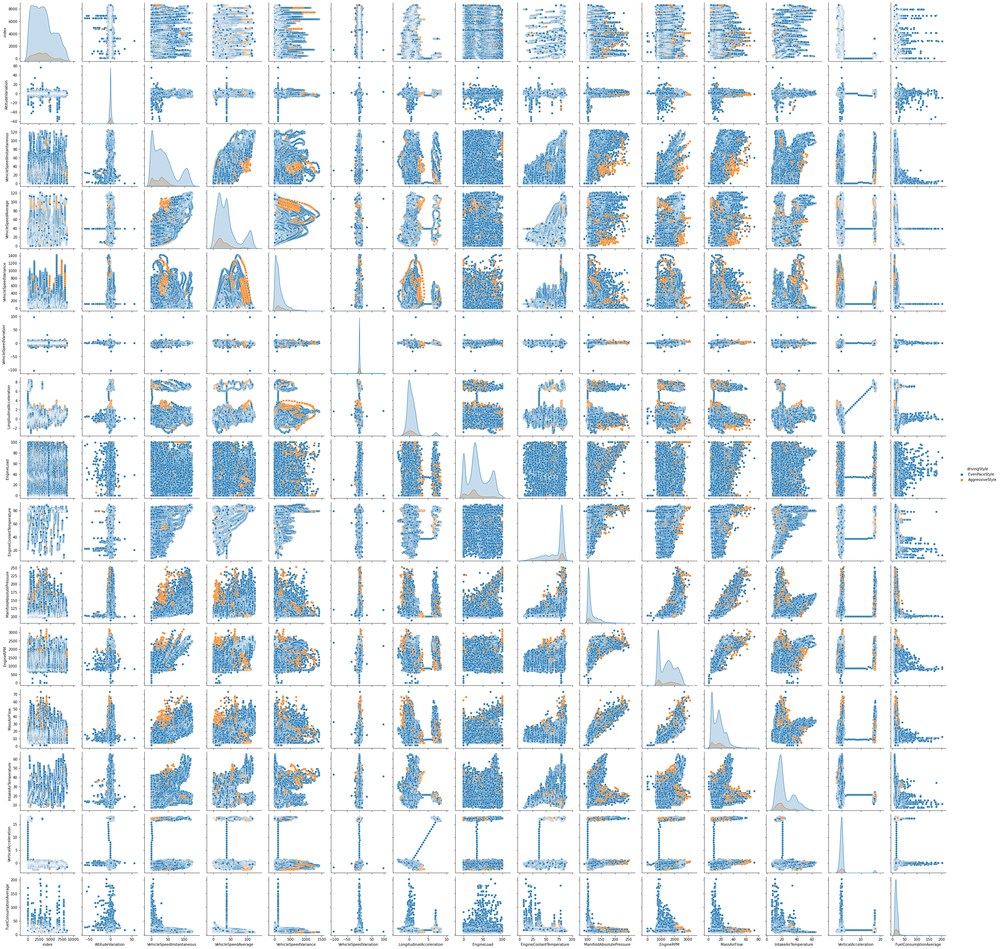

In [54]:
sns.pairplot(all_cars_df, hue="drivingStyle")

Indicators for `drivingStyle` are harder to pinpoint by eye

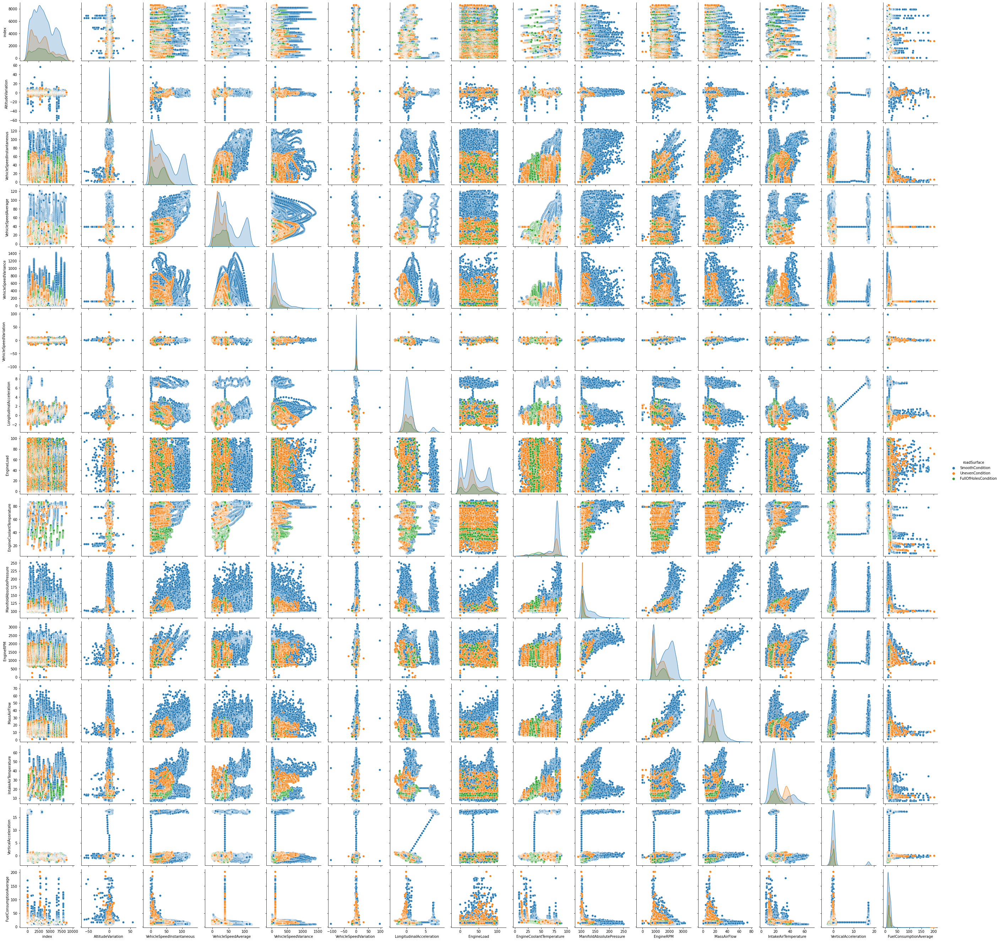

In [55]:
sns.pairplot(all_cars_df, hue="roadSurface")

Indicators for `roadSurface` are harder to pinpoint by eye

Summary of all correlations between attributes

<AxesSubplot:>

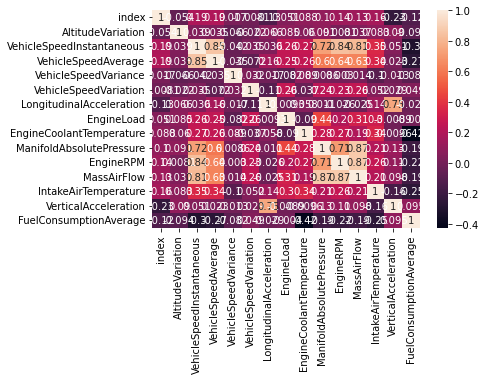

In [56]:
sns.heatmap(all_cars_df.corr(), annot=True)

## Conclusion

This dataset explores multiple attributes of 2 different vehicle types and their relation to `traffic` (low, mid or high), `drivingStyle` (aggresive or normal) and `roadSurface` (even or uneven). It is an interesting dataset since it can be used to predict these mentioned 3 targets contributing to safer transportation since these metrics can be used to warn drivers in real time of surrounding dangers and alert the user of their own driving style

### Pros:
- Large dataset
- Multiple relevant attributes with low intercorrelation
- Multiple target values
- Attributes can be easily input from OBD and Cell Phone sensors

### Cons:
- Data from only 2 vehicle types
- Relatively low number of `aggressive behaviour`, `full of holes road`, `high congestion` and `normal congestion` inputs